<a href="https://colab.research.google.com/github/inderaihsan/Coffee-Linear-Regression/blob/main/Trying_spatial_weight_different_searching.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install pysal 
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.9/112.9 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.3/50.3 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 37.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.5/147.5 kB 16.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 13.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.2/59.2 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.7/243.7 kB 22.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 220.2/220.2 kB 22.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 54.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━

In [2]:
import pandas as pd
import numpy as np
import geopandas as gpd
import pysal
from shapely.geometry import Point
import seaborn as sns 
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error 

/usr/local/lib/python3.9/dist-packages/geopandas/_compat.py:123: UserWarning: The Shapely GEOS version (3.11.1-CAPI-1.17.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
<ipython-input-2-bd58bd8285f1>:3: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  impo

helper function

In [3]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
def create_coordinate_2_dots(dataset , cola,colb) :  
     geom = [] 
     #dataset.set_index('ID', inplace=True) 
     dataset['ID'] = range(1, len(dataset)+1)
     dataset.set_index('ID', inplace = True) 
     i=1
     for j,y in zip(dataset[cola],dataset[colb]) :  
       try : 
         if(pd.notna(j) & pd.notnull(y) & pd.notnull(j)&pd.notna(y)) : 
            j = str(j)
            j = j.replace('°', ' ') 
            j = j.replace(',', ' ') 
            y = str(y)
            y = y.replace('°', ' ') 
            y = y.replace(',', ' ')
            long = float(j) 
            lat = float(y) 
            geom.append(Point(lat, long))  
            i=i+1 
         else : 
            geom.append(Point(-6.211694439526311, 106.82835921068619))
       except : 
          dataset.drop(i, inplace = True) 
          i=i+1 
     dataset.apply(lambda col: col.drop_duplicates().reset_index(drop=True))
     gdf_tra = gpd.GeoDataFrame(dataset, geometry = geom, crs = 4326)     
     gdf_tra.to_crs(epsg=32749, inplace = True)
     return gdf_tra

def evaluate(trueval, predval) : 
  #print('fsd: ', '{0:.2%}'.format(fsd))
  #print ('R2_score : ', '{0:.2}'.format(r2_score(trueval,predval))) 
  #print ('MAE_score :', '{0:.9}'.format(mean_absolute_error(trueval, predval))) 
  #print ('MSE_score :', '{0:.15}'.format(mse(trueval,predval))) 
  #print ('RMSE_score :', '{0:.15}'.format(np.sqrt(mse(trueval,predval)))) 
  prediction = pd.DataFrame()
  pe = ((trueval-predval)/predval) 
  ape = np.abs(pe) 
  prediction['pe'] = pe 
  prediction['ape'] = ape 
  #print('fsd (forecast standard deviation) : ', np.std(pe)) 
  #print('median absolute percentage error : ',np.median(np.abs(pe)))  
  res = {'r2' : r2_score(trueval,predval) , 
          'mae' : mean_absolute_error(trueval, predval), 
          'mse' : mean_squared_error(trueval,predval) , 
          'rmse' :np.sqrt(mean_squared_error(trueval,predval)), 
          'pe10' :len(prediction[prediction['ape'] < 0.1])/len(prediction), 
          'rt20' : len(prediction[prediction['ape'] > 0.2])/len(prediction), 
          'FSD' :np.std(pe), 
          'MAPE' :np.median(np.abs(pe))}
  return res


Reading Data

In [4]:
df = pd.read_excel('/content/RHR_AVM_Data_generated (1).xlsx')
gdf = create_coordinate_2_dots(df, 'latitude', 'longitude') 


In [5]:
gdf.head(5)

,latitude,longitude,luas,bentuk_tapak,hpm,tahun,Covid,Value,Jarak ke Faskes,Jarak ke Halte,...,index_right,Cluster,Logged hpm,Logged Jarak ke Faskes,Logged Jarak ke Halte,Logged Jarak ke Jalan Utama,Logged Jarak ke Pusat Kota,Logged Jarak ke Pendidikan,Logged Jarak ke Perniagaan,geometry
ID,,,,,,,,,,,,,,,,,,,,,
1,-6.227,106.822,1500.000,Persegi,57600000.000,2016,0,86400.000,665.908,465.658,...,10,3,17.869,6.501,6.143,5.907,7.323,5.414,4.282,POINT (37395.709 9309870.763)
2,-6.175,106.858,1369.000,Tidak Beraturan,13500000.000,2017,0,18481.500,343.704,87.000,...,36,2,16.418,5.840,4.466,3.985,8.942,3.805,3.418,POINT (41330.155 9315704.825)
3,-6.238,106.839,812.000,Persegi,30000000.000,2017,0,24360.000,617.639,414.109,...,263,2,17.217,6.426,6.026,6.010,8.223,5.288,5.877,POINT (39300.679 9308674.584)
4,-6.309,106.873,315.000,Persegi Panjang,16000000.000,2019,0,5040.000,218.845,95.386,...,253,2,16.588,5.388,4.558,3.117,9.381,5.633,5.048,POINT (43163.370 9300870.517)
5,-6.184,106.742,300.000,Persegi Panjang,34500000.000,2020,1,10350.000,260.993,2814.677,...,233,2,17.356,5.564,7.943,5.462,9.054,5.994,5.834,POINT (28538.605 9314565.932)


In [ ]:
gdf.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
latitude,3628.000,-6.223,0.067,-6.368,-6.279,-6.213,-6.171,-6.098
longitude,3628.000,106.818,0.062,106.690,106.772,106.814,106.861,106.968
luas,3628.000,4386.015,29084.602,38.000,303.000,694.500,2523.000,1430000.000
hpm,3628.000,20627395.213,15488497.479,148750.000,9818644.958,17000000.000,25934134.615,100000000.000
tahun,3628.000,2020.526,1.241,2016.000,2020.000,2021.000,2021.000,2023.000
Covid,3628.000,0.848,0.359,0.000,1.000,1.000,1.000,1.000
Value,3628.000,71284.590,237110.529,150.000,4454.750,13673.565,51584.625,4485000.000
Jarak ke Faskes,3628.000,584.881,346.508,8.292,334.939,524.283,746.445,2894.195
Jarak ke Halte,3628.000,1748.576,1440.704,16.248,594.031,1359.724,2512.628,7283.331
Jarak ke Jalan Utama,3628.000,306.825,397.712,0.042,34.302,180.558,424.038,3145.298


In [ ]:
gdf = gdf.dropna()
gdf.explore() 

#Adding weights to dataframe

In [6]:
from libpysal.weights import Queen, Rook, KNN
import numpy as np
import libpysal as ps
from mgwr.gwr import GWR, MGWR
from mgwr.sel_bw import Sel_BW
import geopandas as gp
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd

In [7]:
gdf.columns

Index(['latitude', 'longitude', 'luas', 'bentuk_tapak', 'hpm', 'tahun',
       'Covid', 'Value', 'Jarak ke Faskes', 'Jarak ke Halte',
       'Jarak ke Jalan Utama', 'Jarak ke Pusat Kota', 'Lebar Jalan Jakarta',
       'Jarak ke Pendidikan', 'Jarak ke Perniagaan', 'index_right', 'Cluster',
       'Logged hpm', 'Logged Jarak ke Faskes', 'Logged Jarak ke Halte',
       'Logged Jarak ke Jalan Utama', 'Logged Jarak ke Pusat Kota',
       'Logged Jarak ke Pendidikan', 'Logged Jarak ke Perniagaan', 'geometry'],
      dtype='object')

In [51]:
g_y = gdf['Logged hpm'].values.reshape((-1,1))
g_X = gdf[['Logged Jarak ke Faskes', 'Logged Jarak ke Halte',
       'Logged Jarak ke Jalan Utama', 'Logged Jarak ke Pusat Kota',
       'Logged Jarak ke Pendidikan', 'Logged Jarak ke Perniagaan', 'luas']].values
u = gdf['longitude']
v = gdf['latitude']
g_coords = list(zip(u,v))

In [ ]:
gwr_selector = Sel_BW(g_coords, g_y, g_X, fixed = False, multi = False,  kernel = 'bisquare')
gwr_bw = gwr_selector.search(criterion = 'CV', search_method = 'golden_section') 
model = GWR(g_coords, g_y, g_X, gwr_bw)
gwr_results = model.fit()

In [77]:
gwr_bw

88.0

In [79]:
coord_test = list(zip(gdf['longitude'], gdf['latitude']))
model2 = GWR(g_coords, g_y, g_X, bw=gwr_bw, fixed=False, kernel='bisquare')
results = model2.predict(np.array(coord_test), np.array(g_X))
print(results.params.shape)

(3628, 8)


#Error Plotting and Model Evaluation

In [82]:
gwr_results.summary()

Model type                                                         Gaussian
Number of observations:                                                3628
Number of covariates:                                                     8

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                           1090.296
Log-likelihood:                                                   -2967.060
AIC:                                                               5950.120
AICc:                                                              5952.170
BIC:                                                             -28580.805
R2:                                                                   0.479
Adj. R2:                                                              0.478

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

<Axes: title={'center': 'the histogram of the residuals'}, ylabel='Count'>

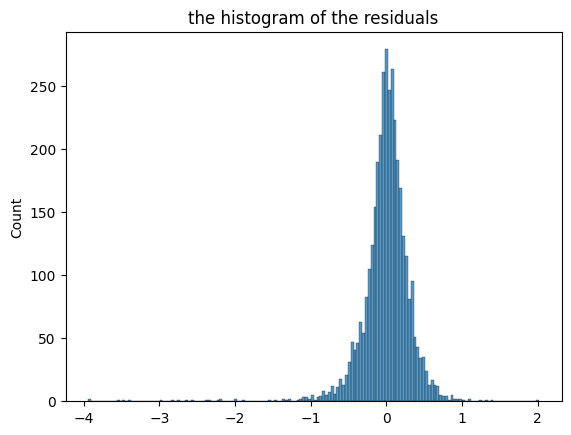

In [83]:
scale = gwr_results.scale 
residuals = gwr_results.resid_response 
plt.title('the histogram of the residuals')
sns.histplot(residuals)

/usr/local/lib/python3.9/dist-packages/spglm/iwls.py:37: LinAlgWarning: Ill-conditioned matrix (rcond=6.53393e-17): result may not be accurate.
  xtx_inv_xt = linalg.solve(xtx, xT)
/usr/local/lib/python3.9/dist-packages/spglm/iwls.py:37: LinAlgWarning: Ill-conditioned matrix (rcond=1.07077e-16): result may not be accurate.
  xtx_inv_xt = linalg.solve(xtx, xT)
/usr/local/lib/python3.9/dist-packages/spglm/iwls.py:37: LinAlgWarning: Ill-conditioned matrix (rcond=5.89113e-17): result may not be accurate.
  xtx_inv_xt = linalg.solve(xtx, xT)
/usr/local/lib/python3.9/dist-packages/spglm/iwls.py:37: LinAlgWarning: Ill-conditioned matrix (rcond=8.44326e-17): result may not be accurate.
  xtx_inv_xt = linalg.solve(xtx, xT)
/usr/local/lib/python3.9/dist-packages/spglm/iwls.py:37: LinAlgWarning: Ill-conditioned matrix (rcond=6.14994e-17): result may not be accurate.
  xtx_inv_xt = linalg.solve(xtx, xT)
/usr/local/lib/python3.9/dist-packages/spglm/iwls.py:37: LinAlgWarning: Ill-conditioned matrix 

<Axes: title={'center': 'hpm and predicted in natural logarithm'}, xlabel='predictions', ylabel='Logged hpm'>

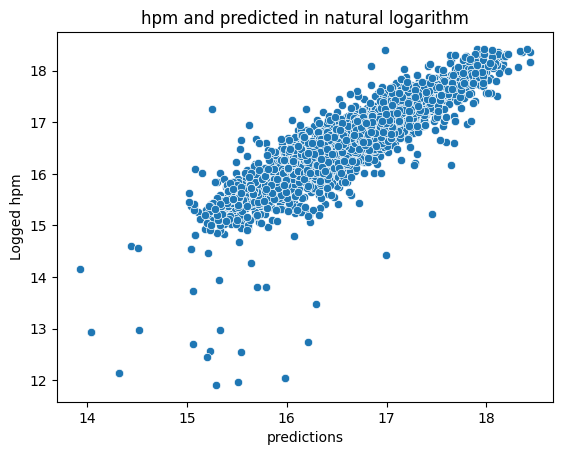

In [84]:
predictions = model.predict(np.array(g_coords), np.array(g_X), gwr_bw, np.array(residuals)) 
predictions = gwr_results.predictions 
predictions = predictions.tolist()  
predictions = [x[0] for x in predictions] 
gdf['predictions'] = predictions 
plt.title('hpm and predicted in natural logarithm')
sns.scatterplot(x = 'predictions', y = 'Logged hpm', data = gdf)

<Axes: title={'center': 'hpm and predicted in natural form'}, xlabel='predictions normal', ylabel='hpm'>

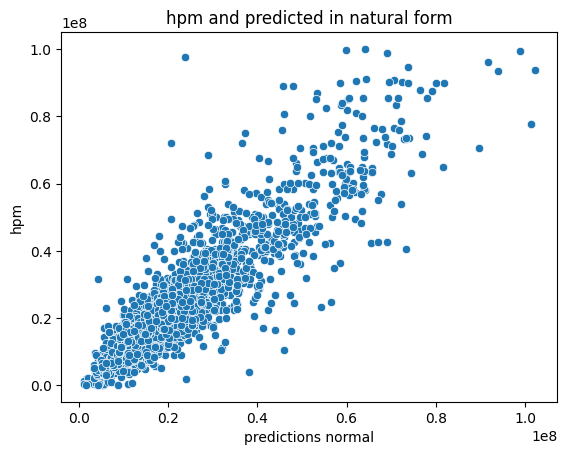

In [85]:
gdf['predictions normal'] = np.exp(predictions) 
plt.title('hpm and predicted in natural form')
sns.scatterplot(x = 'predictions normal', y = 'hpm', data = gdf)

model evaluation

In [86]:
evaluate(gdf['hpm'], gdf['predictions normal'])

{'r2': 0.82680572265687,
 'mae': 3945963.925021505,
 'mse': 41536738660520.82,
 'rmse': 6444900.205629318,
 'pe10': 0.36879823594266814,
 'rt20': 0.3823042998897464,
 'FSD': 0.32105618938106145,
 'MAPE': 0.14758020643500824}

In [87]:
evaluate(gdf['Logged hpm'], gdf['predictions'])

{'r2': 0.7970795545697522,
 'mae': 0.21361531295164599,
 'mse': 0.11702644998925356,
 'rmse': 0.3420912889701425,
 'pe10': 0.9944873208379272,
 'rt20': 0.0013781697905181918,
 'FSD': 0.021171457315300474,
 'MAPE': 0.008867041538212984}

In [102]:
err = np.absolute(gdf['hpm'] - gdf['predictions normal']) 

error visualization

<Axes: ylabel='Count'>

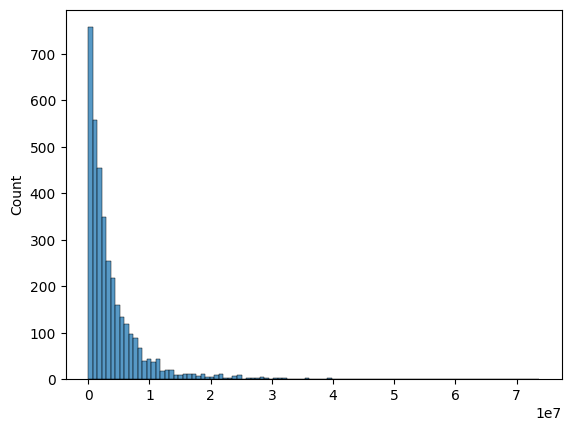

In [110]:
sns.histplot(err, bins = 100)

In [107]:
err.mean()

3945963.925021505

In [114]:
import folium
gdf['%error'] = err/gdf['hpm'] 
m = gdf.explore(
    cmap = 'RdYlGn', 
    column = '%error', 
    scheme='quantiles',
    k=25
)
folium.TileLayer('Stamen Terrain', control=True).add_to(m)  # use folium to add alternative tiles 
folium.TileLayer('https://mt1.google.com/vt/lyrs=y&x={x}&y={y}&z={z}', control=True, attr='Mapbox attribution').add_to(m)  # use folium to add alternative tiles
folium.LayerControl().add_to(m) 
m

1

#Saving Model

In [88]:
import joblib 
model_obj = {'model' : model, 
             'feature' : ['Logged Jarak ke Faskes', 'Logged Jarak ke Halte',
       'Logged Jarak ke Jalan Utama', 'Logged Jarak ke Pusat Kota',
       'Logged Jarak ke Pendidikan', 'Logged Jarak ke Perniagaan', 'luas'], 
       'scale' : scale, 
       'geo': np.array(g_coords)}
filename = 'geographically weighted regression.sav'                                                                                                                                                                                                                                                                               
joblib.dump(model_obj, filename) 

['geographically weighted regression.sav']

In [ ]:
model = joblib.load(filename)